# Basic check and visualization of sc data from blood: GSE267033

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import umap
from sklearn.decomposition import PCA
import scanpy as sc
import anndata
from sklearn.model_selection import train_test_split

### Load dataset - raw counts

In [ ]:
counts = pd.read_csv('../data/references/BIU_2025/GSE267033_counts_RNAseq_sc_WBC.txt', sep = " ", index_col = 0)
counts

,AGCGTCGTCCGGTAAT-1_17_17-White_blood_cells_patient_15,TTGGGCGAGACAAGCC-1_17_17-White_blood_cells_patient_15,TGTGCGGTCTCGTCGT-1_17_17-White_blood_cells_patient_15,CGGAACCTCCTAGCCT-1_17_17-White_blood_cells_patient_15,ATTGTTCTCCGTACGG-1_17_17-White_blood_cells_patient_15,GAATAGATCGTTCTAT-1_17_17-White_blood_cells_patient_15,TTGCTGCTCACAACCA-1_17_17-White_blood_cells_patient_15,TGCCGAGTCCGATAAC-1_17_17-White_blood_cells_patient_15,GTCATTTTCATACGAC-1_17_17-White_blood_cells_patient_15,TTTACGTGTTATCCAG-1_17_17-White_blood_cells_patient_15,...,TTTGACTCACTTCTCG-1_16_16-White_blood_cells_control_9,TTTGACTGTTATCCAG-1_16_16-White_blood_cells_control_9,TTTGATCTCTACTCAT-1_16_16-White_blood_cells_control_9,TTTGATCTCTATGCCC-1_16_16-White_blood_cells_control_9,TTTGATCTCTTGTTAC-1_16_16-White_blood_cells_control_9,TTTGGAGCAAACAGGC-1_16_16-White_blood_cells_control_9,TTTGGAGCATAACAGA-1_16_16-White_blood_cells_control_9,TTTGGAGTCTGATTCT-1_16_16-White_blood_cells_control_9,TTTGTTGCAGGAATAT-1_16_16-White_blood_cells_control_9,TTTGTTGGTAACGCGA-1_16_16-White_blood_cells_control_9
DDX11L1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1302-2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC240274.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
U1-14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
U1-15,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AC213203.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
adata = anndata.AnnData(counts.transpose())
adata

AnnData object with n_obs × n_vars = 29890 × 58051

In [ ]:
# Add metadata
metadata = pd.read_csv('../data/references/BIU_2025/GSE267033_metadata_RNAseq_sc_WBC.txt', index_col = 0, sep = " ")
metadata

,n_genes,n_counts,pct_counts_mitochondrial,pct_counts_ribosomal,gender,leiden,cell.type,NAS_group,NAS,Control_MAFLD,sampleID
AGCGTCGTCCGGTAAT-1_17_17-White_blood_cells_patient_15,743,1217,5.669680,23.911257,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
TTGGGCGAGACAAGCC-1_17_17-White_blood_cells_patient_15,206,289,19.377163,2.768166,Male,0,Neutrophil,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
TGTGCGGTCTCGTCGT-1_17_17-White_blood_cells_patient_15,1973,4529,10.885405,26.076397,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
CGGAACCTCCTAGCCT-1_17_17-White_blood_cells_patient_15,210,305,29.508198,8.196721,Male,2,CD14+ Monocyte,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
ATTGTTCTCCGTACGG-1_17_17-White_blood_cells_patient_15,774,1619,2.470661,0.308833,Male,0,Neutrophil,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAAACAGGC-1_16_16-White_blood_cells_control_9,163,246,22.357723,8.536586,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9
TTTGGAGCATAACAGA-1_16_16-White_blood_cells_control_9,169,267,24.344570,6.741573,Female,11,Megakaryocyte,Control,NaN,Control,White_blood_cells_control_9
TTTGGAGTCTGATTCT-1_16_16-White_blood_cells_control_9,673,1176,4.846939,1.020408,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9
TTTGTTGCAGGAATAT-1_16_16-White_blood_cells_control_9,1144,2880,2.534722,0.555556,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9


In [6]:
adata.obs = metadata.loc[adata.obs_names.tolist()]
adata.obs

,n_genes,n_counts,pct_counts_mitochondrial,pct_counts_ribosomal,gender,leiden,cell.type,NAS_group,NAS,Control_MAFLD,sampleID
AGCGTCGTCCGGTAAT-1_17_17-White_blood_cells_patient_15,743,1217,5.669680,23.911257,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
TTGGGCGAGACAAGCC-1_17_17-White_blood_cells_patient_15,206,289,19.377163,2.768166,Male,0,Neutrophil,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
TGTGCGGTCTCGTCGT-1_17_17-White_blood_cells_patient_15,1973,4529,10.885405,26.076397,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
CGGAACCTCCTAGCCT-1_17_17-White_blood_cells_patient_15,210,305,29.508198,8.196721,Male,2,CD14+ Monocyte,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
ATTGTTCTCCGTACGG-1_17_17-White_blood_cells_patient_15,774,1619,2.470661,0.308833,Male,0,Neutrophil,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15
...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAAACAGGC-1_16_16-White_blood_cells_control_9,163,246,22.357723,8.536586,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9
TTTGGAGCATAACAGA-1_16_16-White_blood_cells_control_9,169,267,24.344570,6.741573,Female,11,Megakaryocyte,Control,NaN,Control,White_blood_cells_control_9
TTTGGAGTCTGATTCT-1_16_16-White_blood_cells_control_9,673,1176,4.846939,1.020408,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9
TTTGTTGCAGGAATAT-1_16_16-White_blood_cells_control_9,1144,2880,2.534722,0.555556,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9


In [7]:
# Remove cells with too few genes and genes with expression in too few cells
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_cells=30)

In [8]:
# Edit obs for pseudobulk simulator
adata.obs['cell_type'] = adata.obs['cell.type']
adata.obs['individual'] = adata.obs['sampleID'].str.split("cells_", expand= True).iloc[:,-1]
adata.obs['condition'] = adata.obs['NAS_group']
adata.obs_names_make_unique()
adata.obs

,n_genes,n_counts,pct_counts_mitochondrial,pct_counts_ribosomal,gender,leiden,cell.type,NAS_group,NAS,Control_MAFLD,sampleID,cell_type,individual,condition
AGCGTCGTCCGGTAAT-1_17_17-White_blood_cells_patient_15,743,1217,5.669680,23.911257,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Memory CD4+ T-cells and Treg,patient_15,high_NAS
TGTGCGGTCTCGTCGT-1_17_17-White_blood_cells_patient_15,1973,4529,10.885405,26.076397,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Memory CD4+ T-cells and Treg,patient_15,high_NAS
ATTGTTCTCCGTACGG-1_17_17-White_blood_cells_patient_15,774,1619,2.470661,0.308833,Male,0,Neutrophil,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Neutrophil,patient_15,high_NAS
GAATAGATCGTTCTAT-1_17_17-White_blood_cells_patient_15,2692,7925,7.507887,30.233440,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Memory CD4+ T-cells and Treg,patient_15,high_NAS
GTCATTTTCATACGAC-1_17_17-White_blood_cells_patient_15,1520,3554,7.681486,29.319078,Male,4,(Naive-like) CD4+ T-cell,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,(Naive-like) CD4+ T-cell,patient_15,high_NAS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCTCTATGCCC-1_16_16-White_blood_cells_control_9,1035,1922,1.248699,0.884495,Female,0,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophil,control_9,Control
TTTGATCTCTTGTTAC-1_16_16-White_blood_cells_control_9,595,987,5.876393,0.911854,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophil,control_9,Control
TTTGGAGTCTGATTCT-1_16_16-White_blood_cells_control_9,673,1176,4.846939,1.020408,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophil,control_9,Control
TTTGTTGCAGGAATAT-1_16_16-White_blood_cells_control_9,1144,2880,2.534722,0.555556,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophil,control_9,Control


#### Change level of cell type granularity and annotation nomenclature

In [9]:
rename_dict = {'Memory CD4+ T-cells and Treg' : 'Tregs', 'Neutrophil' : 'Neutrophils',
       '(Naive-like) CD4+ T-cell' : 'CD4 T cells', '(Naive-like) CD8+ T-cell' : 'CD8 T cells',
       'CD8+ memory T-cell' : 'CD8 T cells', 'NK' : 'NK cells', 'B-cell' : 'B cells', 'MAIT T-cell' : 'Other',
       'CD14+ Monocyte' : 'Monocytes', 'CD16+ Monocyte' : 'Monocytes', 'Basophil' : 'Basophils',
       'Plasmacytoid dendritic cell' : 'DC', 'Monocyte' : 'Monocytes', 'Megakaryocyte' : 'Other'}

adata.obs['cell_type'] = adata.obs['cell.type'].replace(rename_dict)
adata.obs

,n_genes,n_counts,pct_counts_mitochondrial,pct_counts_ribosomal,gender,leiden,cell.type,NAS_group,NAS,Control_MAFLD,sampleID,cell_type,individual,condition
AGCGTCGTCCGGTAAT-1_17_17-White_blood_cells_patient_15,743,1217,5.669680,23.911257,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Tregs,patient_15,high_NAS
TGTGCGGTCTCGTCGT-1_17_17-White_blood_cells_patient_15,1973,4529,10.885405,26.076397,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Tregs,patient_15,high_NAS
ATTGTTCTCCGTACGG-1_17_17-White_blood_cells_patient_15,774,1619,2.470661,0.308833,Male,0,Neutrophil,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Neutrophils,patient_15,high_NAS
GAATAGATCGTTCTAT-1_17_17-White_blood_cells_patient_15,2692,7925,7.507887,30.233440,Male,1,Memory CD4+ T-cells and Treg,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,Tregs,patient_15,high_NAS
GTCATTTTCATACGAC-1_17_17-White_blood_cells_patient_15,1520,3554,7.681486,29.319078,Male,4,(Naive-like) CD4+ T-cell,high_NAS,6.0,MAFLD/MASH,White_blood_cells_patient_15,CD4 T cells,patient_15,high_NAS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCTCTATGCCC-1_16_16-White_blood_cells_control_9,1035,1922,1.248699,0.884495,Female,0,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophils,control_9,Control
TTTGATCTCTTGTTAC-1_16_16-White_blood_cells_control_9,595,987,5.876393,0.911854,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophils,control_9,Control
TTTGGAGTCTGATTCT-1_16_16-White_blood_cells_control_9,673,1176,4.846939,1.020408,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophils,control_9,Control
TTTGTTGCAGGAATAT-1_16_16-White_blood_cells_control_9,1144,2880,2.534722,0.555556,Female,3,Neutrophil,Control,NaN,Control,White_blood_cells_control_9,Neutrophils,control_9,Control


#### Check overall data composition

In [10]:
# Function for creation of visualizations

def cluster_data(anndata, anno_layer):
    adata = anndata.copy()
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pl.pca(adata, annotate_var_explained=True, color=anno_layer)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=["cell.type", "cell_type", "condition", "individual"])
    plt.tight_layout()

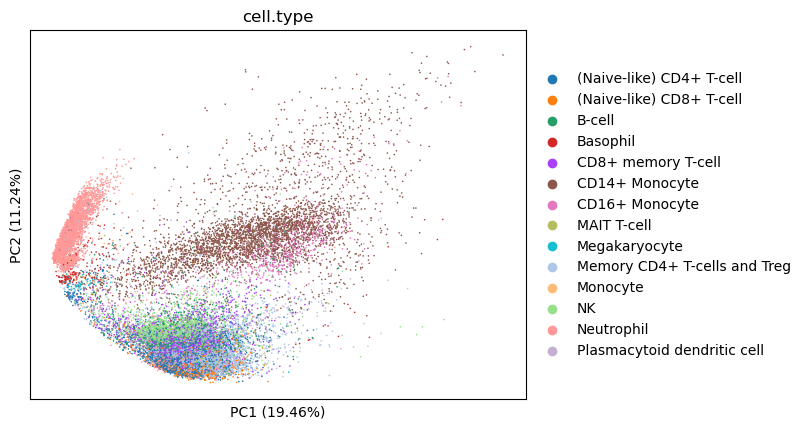

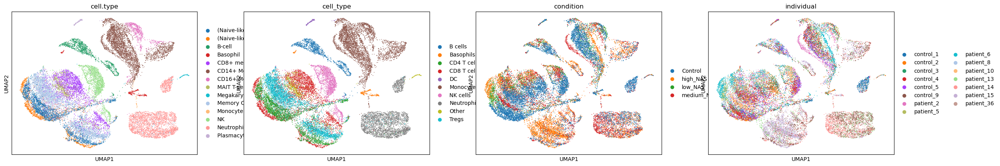

<Figure size 640x480 with 0 Axes>

In [11]:
cluster_data(adata, 'cell.type')

#### Processing for Finotello bulk data

In [12]:
# Target cell types needed for respective deconvolution approaches

cell_types_finotello_1 = ['Neutrophils', 'Monocytes', 'CD4 T cells', 'NK cells', 'DC', 'Tregs', 'Other', 'B cells', 'CD8 T cells']
cell_types_finotello_2 = ['Neutrophils', 'Monocytes', 'CD4 T cells', 'NK cells', 'DC', 'Tregs', 'B cells', 'CD8 T cells']
cell_types_finotello_3 = ['Neutrophils', 'Monocytes', 'CD4 T cells', 'NK cells', 'DC', 'B cells', 'CD8 T cells']
cell_types_finotello_4 = ['Monocytes', 'CD4 T cells', 'NK cells', 'DC', 'Tregs', 'Other', 'B cells', 'CD8 T cells']
cell_types_finotello_5 = ['Monocytes', 'CD4 T cells', 'NK cells', 'DC', 'Tregs', 'B cells', 'CD8 T cells']

In [13]:
# Adata for Finotello deconvolution
adata_finotello = adata.copy()

In [14]:
# Function for data subsetting and splitting

def subset_split_adata(adata, cell_types):
    adata_subset = adata.copy()
    adata_subset = adata_subset[adata_subset.obs['cell_type'].isin(cell_types)]
    train_labels, test_labels = train_test_split(adata_subset.obs, test_size=0.2, random_state=42, stratify=adata_subset.obs['cell_type'])

    train_adata = adata_subset[train_labels.index.tolist()]
    test_adata = adata_subset[test_labels.index.tolist()]
    
    return train_adata, test_adata

In [15]:
set1_finotello_train, set1_finotello_test = subset_split_adata(adata_finotello, cell_types_finotello_1)
set2_finotello_train, set2_finotello_test = subset_split_adata(adata_finotello, cell_types_finotello_2)
set3_finotello_train, set3_finotello_test = subset_split_adata(adata_finotello, cell_types_finotello_3)
set4_finotello_train, set4_finotello_test = subset_split_adata(adata_finotello, cell_types_finotello_4)
set5_finotello_train, set5_finotello_test = subset_split_adata(adata_finotello, cell_types_finotello_5)

In [16]:
# Summarize neutrophils and others

adata_finotello_edit = adata.copy()
rename_dict = {'Neutrophils' : 'Other'}

adata_finotello_edit.obs['cell_type'] = adata_finotello_edit.obs['cell_type'].replace(rename_dict)

set6_finotello_train, set6_finotello_test = subset_split_adata(adata_finotello_edit, cell_types_finotello_4)

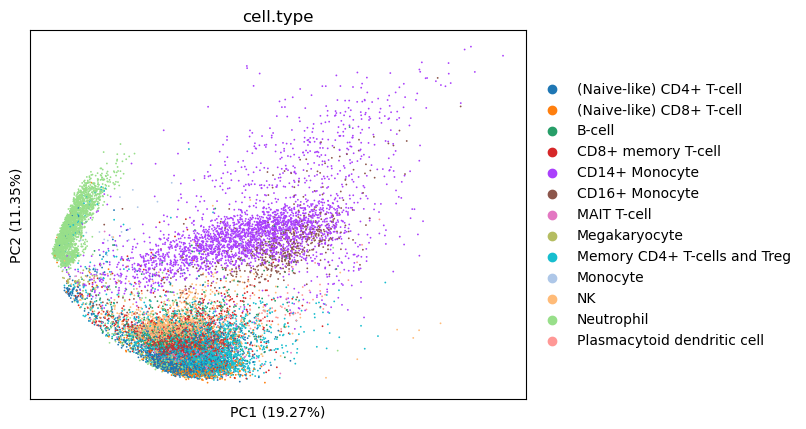

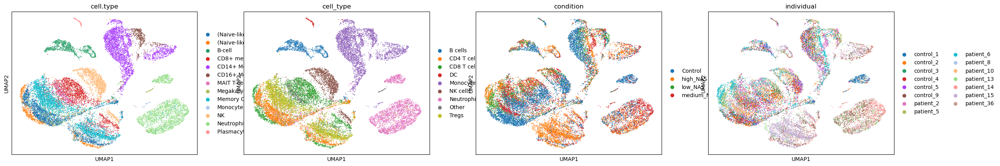

<Figure size 640x480 with 0 Axes>

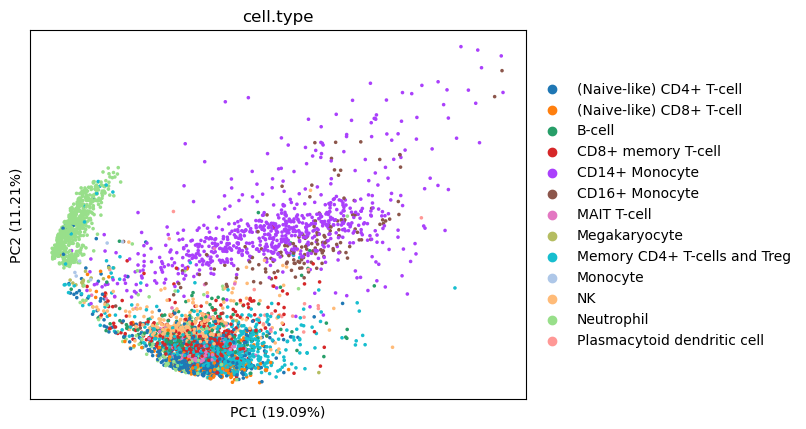

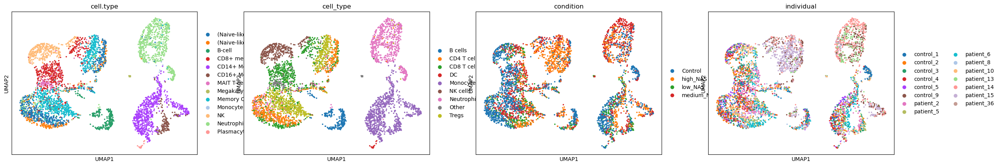

<Figure size 640x480 with 0 Axes>

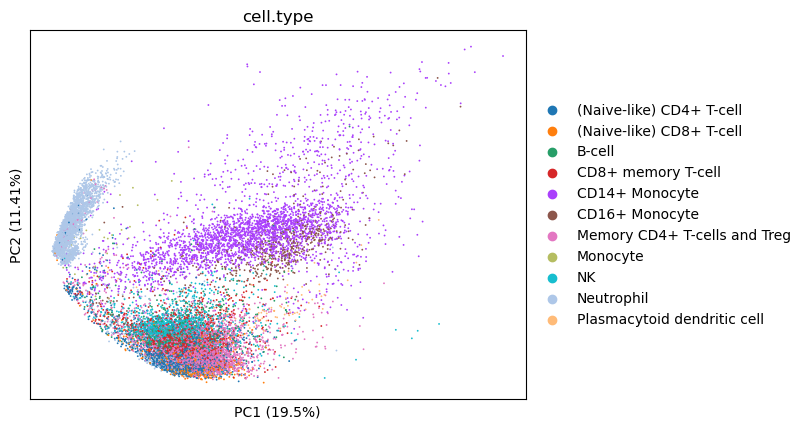

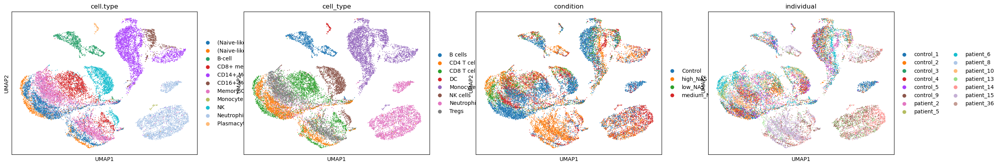

<Figure size 640x480 with 0 Axes>

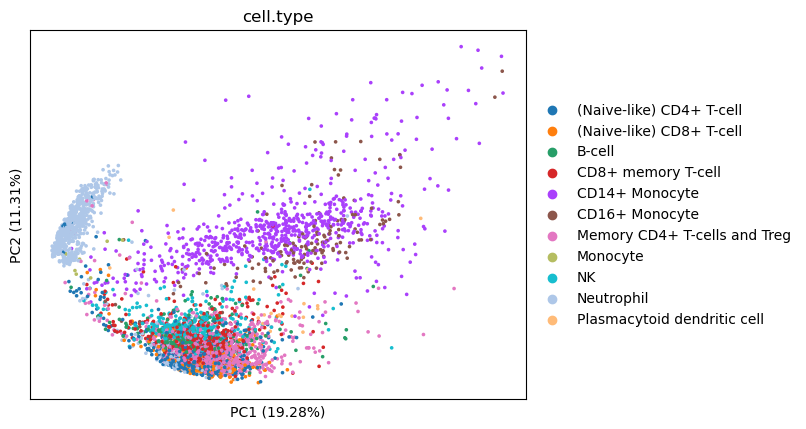

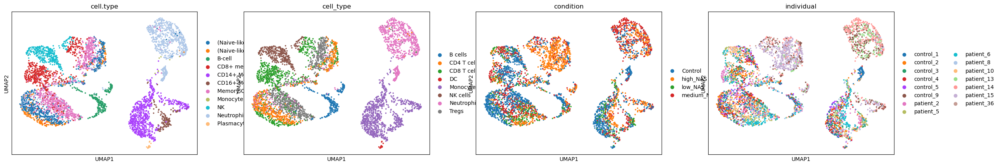

<Figure size 640x480 with 0 Axes>

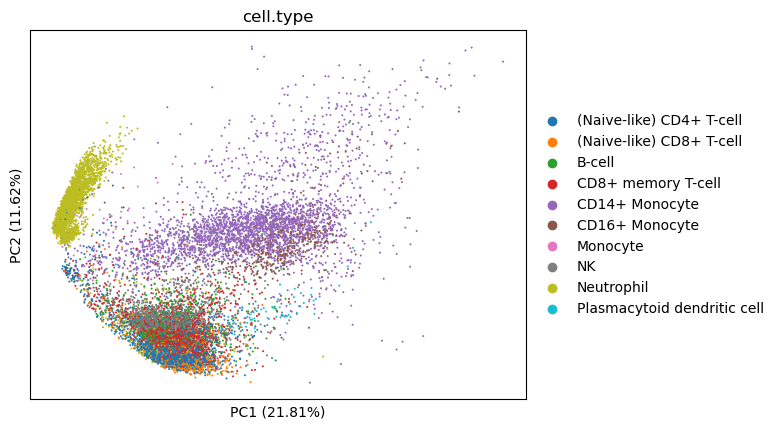

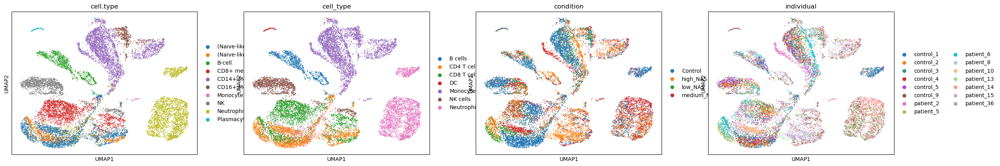

<Figure size 640x480 with 0 Axes>

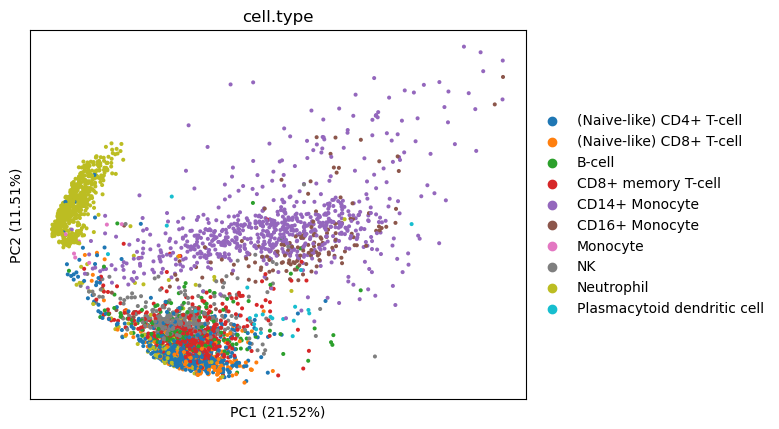

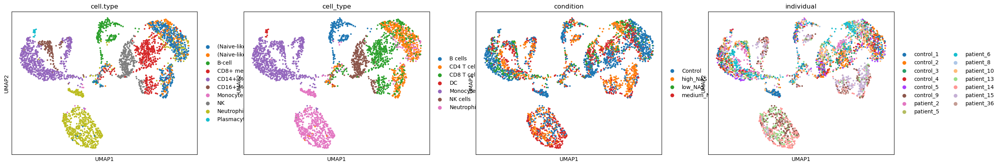

<Figure size 640x480 with 0 Axes>

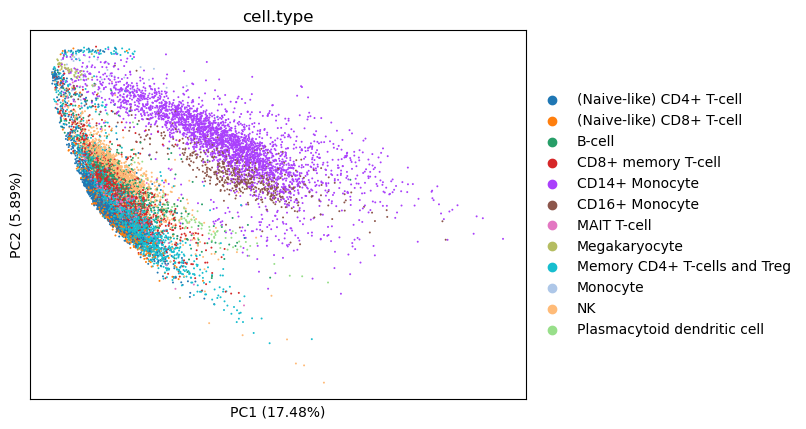

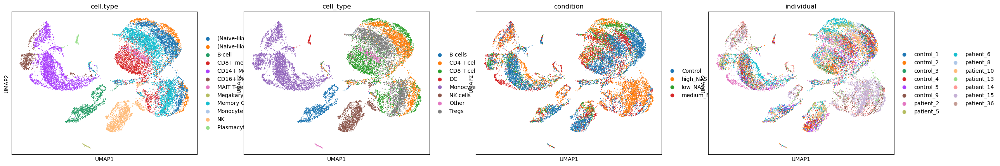

<Figure size 640x480 with 0 Axes>

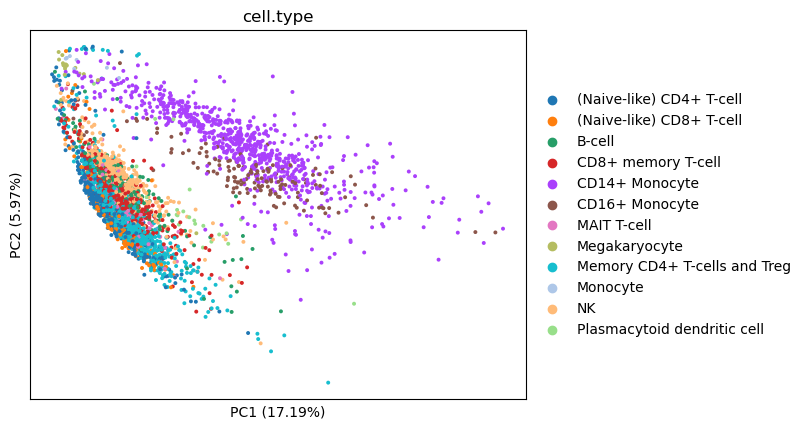

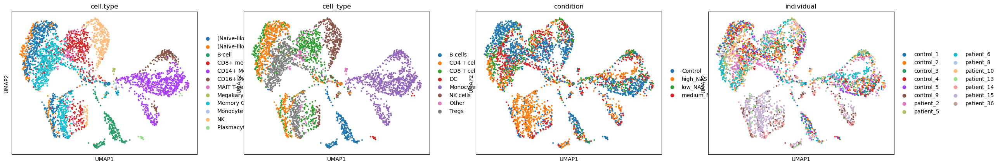

<Figure size 640x480 with 0 Axes>

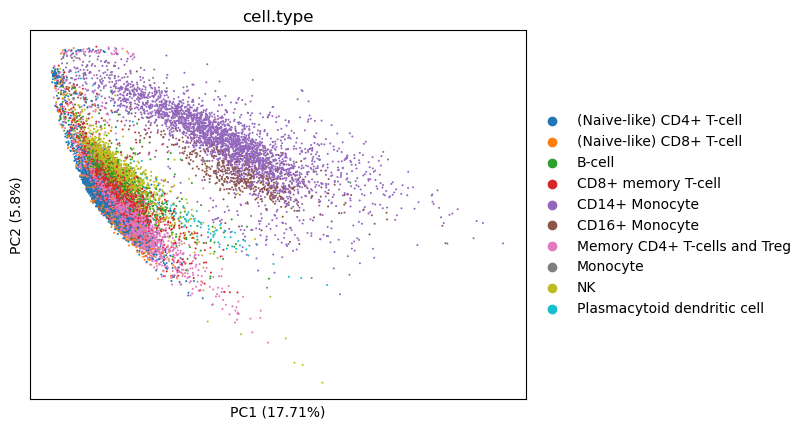

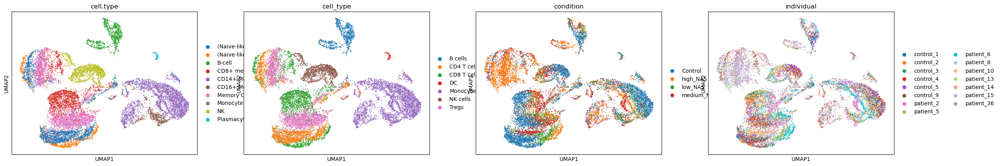

<Figure size 640x480 with 0 Axes>

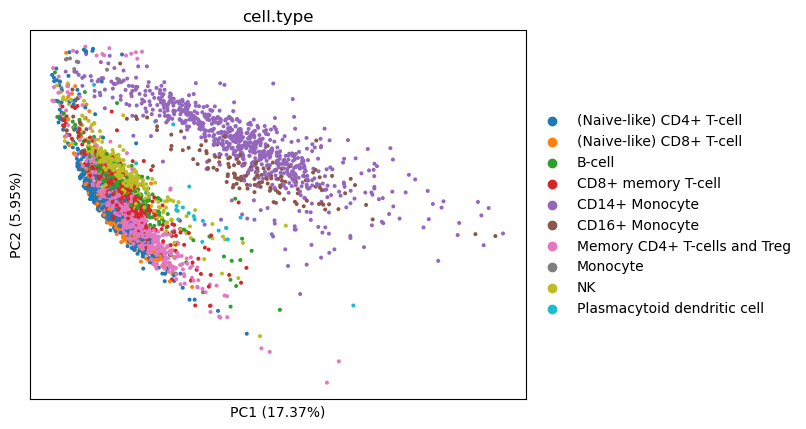

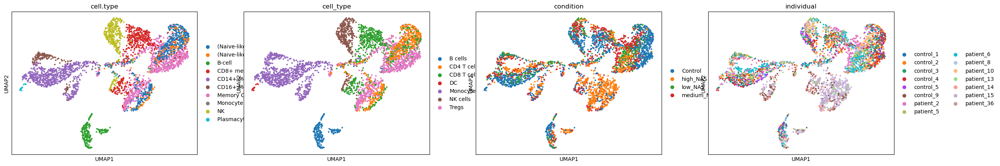

<Figure size 640x480 with 0 Axes>

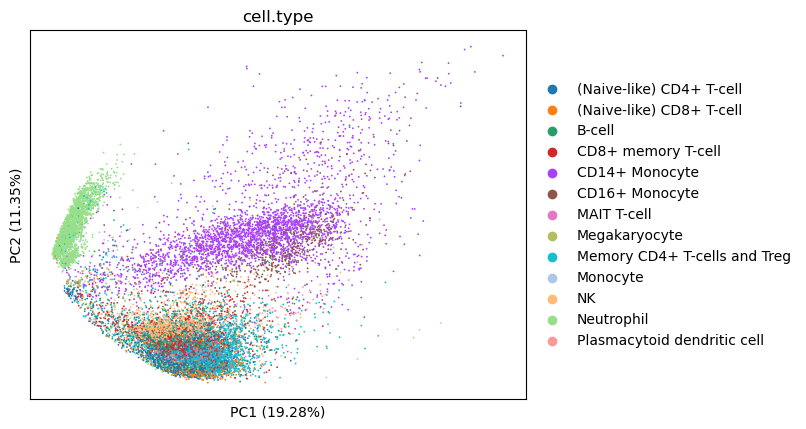

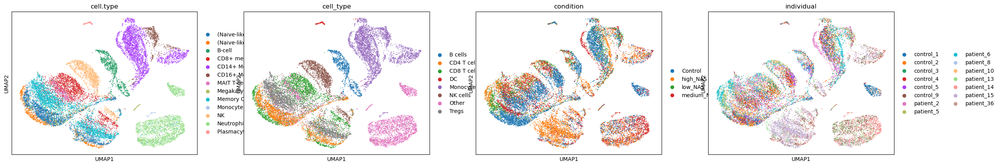

<Figure size 640x480 with 0 Axes>

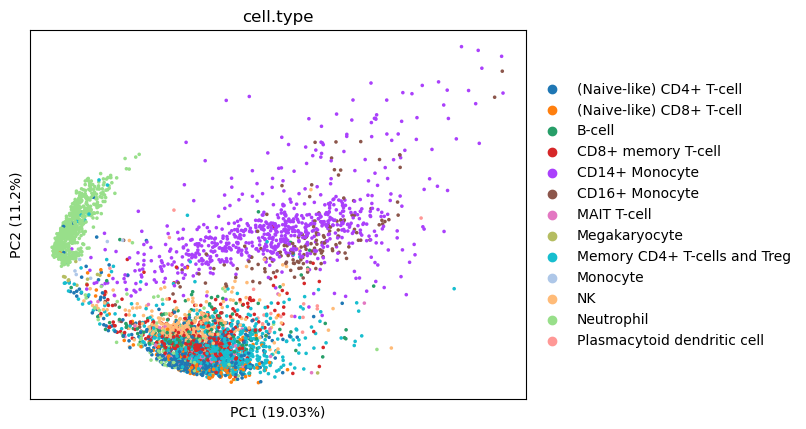

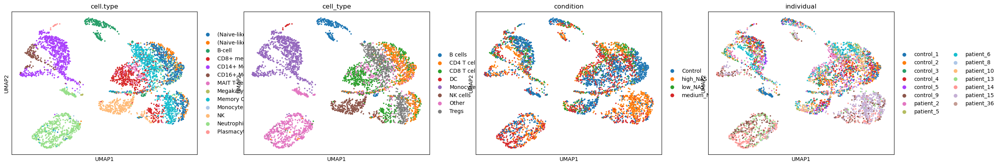

<Figure size 640x480 with 0 Axes>

In [17]:
# Perform analyis for each set

cluster_data(set1_finotello_train, 'cell.type')
cluster_data(set1_finotello_test, 'cell.type')
cluster_data(set2_finotello_train, 'cell.type')
cluster_data(set2_finotello_test, 'cell.type')
cluster_data(set3_finotello_train, 'cell.type')
cluster_data(set3_finotello_test, 'cell.type')
cluster_data(set4_finotello_train, 'cell.type')
cluster_data(set4_finotello_test, 'cell.type')
cluster_data(set5_finotello_train, 'cell.type')
cluster_data(set5_finotello_test, 'cell.type')
cluster_data(set6_finotello_train, 'cell.type')
cluster_data(set6_finotello_test, 'cell.type')

In [18]:
# Save data as h5ad objects

def save_adata(adata_list, name_list):
    import warnings
    warnings.filterwarnings("ignore")
    for i in range(len(adata_list)):
        data_to_save = adata_list[i]
        name = name_list[i]
        data_to_save.write_h5ad(f'{name}.h5ad')
        print(f"Saved {name}.h5ad")

In [19]:
adata_finotello_list = [set1_finotello_train, set1_finotello_test, set2_finotello_train, set2_finotello_test, set3_finotello_train, set3_finotello_test, set4_finotello_train, set4_finotello_test, set5_finotello_train, set5_finotello_test, set6_finotello_train, set6_finotello_test]
file_name_list = ['BIU_1_train', 'BIU_1_test', 'BIU_2_train', 'BIU_2_test', 'BIU_3_train', 'BIU_3_test', 'BIU_4_train', 'BIU_4_test', 'BIU_5_train', 'BIU_5_test', 'BIU_6_train', 'BIU_6_test']
save_adata(adata_finotello_list, file_name_list)

Saved BIU_1_train.h5ad
Saved BIU_1_test.h5ad
Saved BIU_2_train.h5ad
Saved BIU_2_test.h5ad
Saved BIU_3_train.h5ad
Saved BIU_3_test.h5ad
Saved BIU_4_train.h5ad
Saved BIU_4_test.h5ad
Saved BIU_5_train.h5ad
Saved BIU_5_test.h5ad
Saved BIU_6_train.h5ad
Saved BIU_6_test.h5ad


#### Processing for OConnell bulk data

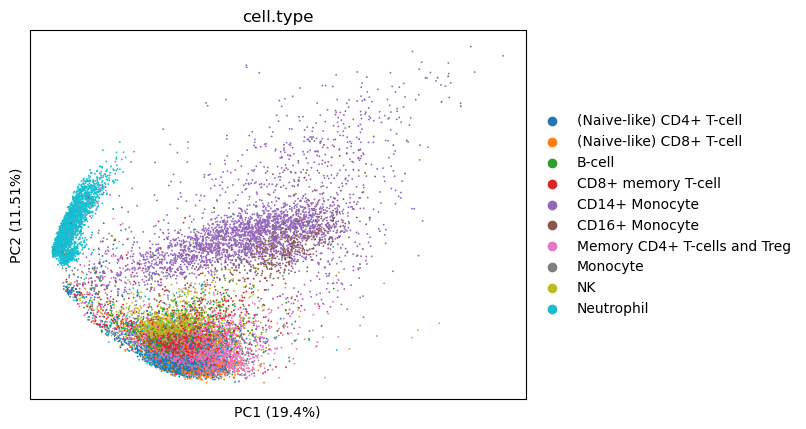

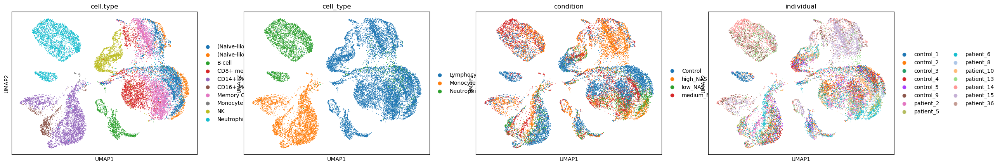

<Figure size 640x480 with 0 Axes>

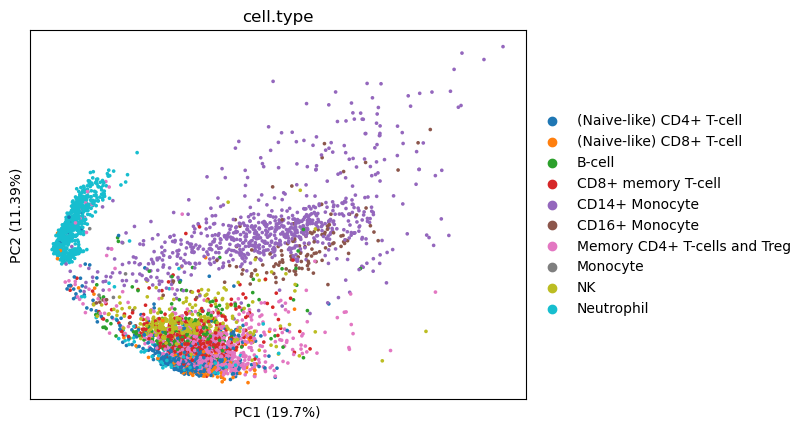

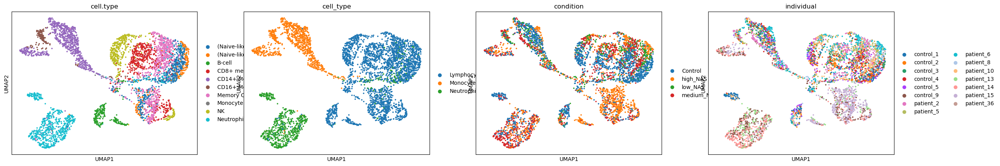

<Figure size 640x480 with 0 Axes>

In [20]:
# Adata for Finotello deconvolution
adata_oconnel = adata.copy()

# Target cell types needed for respective deconvolution approaches
cell_types_oconnell = ['Neutrophils', 'Monocytes', 'Lymphocytes']

# Group Lymphocytes together and therefore rename cell types
rename_dict = {'CD4 T cells' : 'Lymphocytes', 'NK cells'  : 'Lymphocytes', 'Tregs' : 'Lymphocytes', 'B cells' : 'Lymphocytes', 'CD8 T cells' : 'Lymphocytes'}
adata_oconnel.obs['cell_type'] = adata_oconnel.obs['cell_type'].replace(rename_dict)

# Subset and split data for OConnell
oconnel_train, oconnel_test = subset_split_adata(adata_oconnel, cell_types_oconnell)

# Visualize data
cluster_data(oconnel_train, 'cell.type')
cluster_data(oconnel_test, 'cell.type')

In [21]:
adata_oconnel_list = [oconnel_train, oconnel_test]
file_name_list = ['BIU_7_train', 'BIU_7_test']
save_adata(adata_oconnel_list, file_name_list)

Saved BIU_7_train.h5ad
Saved BIU_7_test.h5ad


BIU_7 dataset used in the GrooD paper.